# <p style="background-color:#FFC0CB;font-family:newtimeroman;color:#222021;font-size:130%;text-align:center;border-radius:10px 10px;margin-bottom:20px;">**Cat Species Recognition**</p>

<p align="center">
  <img src="https://st2.depositphotos.com/1008660/9611/i/950/depositphotos_96115196-stock-photo-five-big-wild-cats.jpg" alt="Cat Species" width="600">
  <br>
  Source : Depositphotos.com
</p>

# <p style="background-color:#FFC0CB;font-family:newtimeroman;color:#222021;font-size:130%;text-align:center;border-radius:10px 10px;margin-bottom:8px;">**Introduction**</p>

**Author : Salsa Sabitha Hurriyah**
  
**Objective :**  
Computer Vision Model for Cat Species Recognition.   
  
**Data Source :**  
Kaggle : https://www.kaggle.com/datasets/juliencalenge/felidae-tiger-lion-cheetah-leopard-puma/data

**Data Overview :**  
This dataset contains images of lion, tiger, puma, cheetah, and leopard.

Bisnis use case : Pengembangan Aplikasi Mobile  
Pengenalan spesies kucing diimplementasikan dalam aplikasi mobile yang dirancang untuk pengguna umum. Jadi, seseorang dapat mengambil foto kucing yang mereka lihat di alam liar atau di kebun binatang dan menggunakan aplikasi untuk mengidentifikasi spesiesnya. Ini dapat menjadi alat yang berguna bagi Industri Pariwisata seperti di kebun binatang. Dengan sistem pengenalan spesies, pengelola taman safari dapat menghasilkan pengalaman yang lebih interaktif dengan memberikan informasi langsung kepada pengunjung tentang spesies kucing yang mereka lihat, untuk lebih lanjutnya dapat menambahkan fakta-fakta unik dan habitat alami dari binatang tersebut.  

# <p style="background-color:#FFC0CB;font-family:newtimeroman;color:#222021;font-size:130%;text-align:center;border-radius:10px 10px;margin-bottom:10px;">**Import Libraries**</p>

In [2]:
# Import libraries
import os
import cv2
import glob
import random
import string
import shutil
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow import keras
from keras import layers
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Dense,Dropout,Conv2D,MaxPooling2D,Flatten,Input,GlobalAveragePooling2D,Add

from sklearn.metrics import confusion_matrix, classification_report

import warnings
warnings.filterwarnings('ignore')

# <p style="background-color:#FFC0CB;font-family:newtimeroman;color:#222021;font-size:130%;text-align:center;border-radius:10px 10px;margin-bottom:10px;">**Data Loading**</p>

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [5]:
# Make a directory named `.kaggle`
!mkdir ~/.kaggle

# Copy the kaggle.json into this new directory
!cp /content/drive/MyDrive/kaggle.json ~/.kaggle/

# Change permission for this directory :
!chmod 600 ~/.kaggle/kaggle.json

mkdir: cannot create directory ‘/root/.kaggle’: File exists


In [6]:
%%time
# Download Dataset
# Source dataset : https://www.kaggle.com/datasets/juliencalenge/felidae-tiger-lion-cheetah-leopard-puma/data

!kaggle datasets download -d juliencalenge/felidae-tiger-lion-cheetah-leopard-puma

felidae-tiger-lion-cheetah-leopard-puma.zip: Skipping, found more recently modified local copy (use --force to force download)
CPU times: user 10.8 ms, sys: 2.03 ms, total: 12.8 ms
Wall time: 912 ms


In [7]:
!pwd

/content


In [ ]:
# Every dataset that downloaded from Kaggle, is in format `.zip`. So, we must unzip it before we can using the dataset.

!unzip -q ./felidae-tiger-lion-cheetah-leopard-puma.zip

# <p style="background-color:#FFC0CB;font-family:newtimeroman;color:#222021;font-size:130%;text-align:center;border-radius:10px 10px;margin-bottom:10px;">**Feature Engineering**</p>

In [9]:
# Path ke folder utama dataset
dataset_path = "/content/Felidae"

# Membuat direktori untuk train, test, dan validation sets
train_dir = "/content/train"
test_dir = "/content/test"
val_dir = "/content/validation"

os.makedirs(train_dir, exist_ok=True)
os.makedirs(test_dir, exist_ok=True)
os.makedirs(val_dir, exist_ok=True)

# Membagi dataset menjadi train, test, dan validation sets
for cls in os.listdir(dataset_path):
    # Path ke folder kelas saat ini
    class_path = os.path.join(dataset_path, cls)

    # Membuat sub-direktori untuk kelas saat ini di train, test, dan validation sets
    os.makedirs(os.path.join(train_dir, cls), exist_ok=True)
    os.makedirs(os.path.join(test_dir, cls), exist_ok=True)
    os.makedirs(os.path.join(val_dir, cls), exist_ok=True)

    # Membagi data menjadi train, test, dan validation sets
    images = os.listdir(class_path)
    train_images, test_val_images = train_test_split(images, test_size=0.3, random_state=42)
    test_images, val_images = train_test_split(test_val_images, test_size=0.5, random_state=42)

    # Memindahkan gambar ke dalam direktori yang sesuai
    for img in train_images:
        src = os.path.join(class_path, img)
        dst = os.path.join(train_dir, cls, img)
        shutil.copyfile(src, dst)

    for img in test_images:
        src = os.path.join(class_path, img)
        dst = os.path.join(test_dir, cls, img)
        shutil.copyfile(src, dst)

    for img in val_images:
        src = os.path.join(class_path, img)
        dst = os.path.join(val_dir, cls, img)
        shutil.copyfile(src, dst)

print("Dataset telah dibagi menjadi train, test, dan validation sets.")


Dataset telah dibagi menjadi train, test, dan validation sets.


In [10]:
# Function untuk melihat jumlah data untuk setiap class
def check_path(path):
  labels = os.listdir(path)
  for label in labels:
    num_data = len(os.listdir(os.path.join(path, label)))
    print(f'Total Data - {label} : {num_data}')

print('Train Path')
check_path(train_dir)
print('')

print('Val Path')
check_path(val_dir)
print('')

print('Test Path')
check_path(test_dir)

Train Path
Total Data - Tiger : 33
Total Data - Puma : 28
Total Data - Leopard : 35
Total Data - Cheetah : 39
Total Data - Lion : 34

Val Path
Total Data - Tiger : 8
Total Data - Puma : 6
Total Data - Leopard : 8
Total Data - Cheetah : 9
Total Data - Lion : 8

Test Path
Total Data - Tiger : 7
Total Data - Puma : 6
Total Data - Leopard : 7
Total Data - Cheetah : 8
Total Data - Lion : 7


Class yang memiliki jumlah data terbanyak adalah Cheetah dan yang paling sedikit adalah Puma. Perbedaan jumlah data cukup besar (data tidak seimbang) untuk Train Set sehingga mungkin akan berpengaruh pada model.

---
# 5 - Exploratory Data Analysis (EDA)

#### Menampilkan jumlah data untuk setiap Class

In [ ]:
# Function untuk menampilkan visualisasi jumlah data untuk setiap class
def visual_path(path):
    labels = os.listdir(path)
    label_names = []
    num_data = []
    for label in labels:
        label_names.append(label)
        num_data.append(len(os.listdir(os.path.join(path, label))))

    # Membuat plot bar
    plt.figure(figsize=(10, 6))
    plt.bar(label_names, num_data, color='skyblue')
    plt.xlabel('Label')
    plt.ylabel('Number of Data')
    plt.title(f'Number of Data for Each Label in {os.path.basename(path)} Set')
    plt.xticks()
    plt.tight_layout()
    plt.show()

    return label_names, num_data

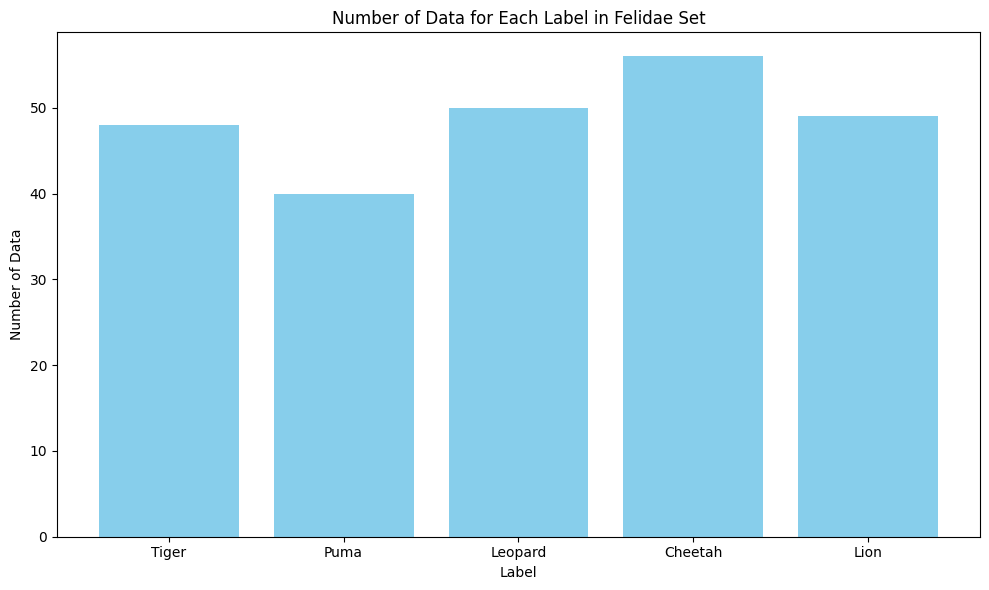

In [ ]:
# Menampilkan visualisasi jumlah data untuk setiap class pada Dataset
label_names, num_data = visual_path(dataset_path)

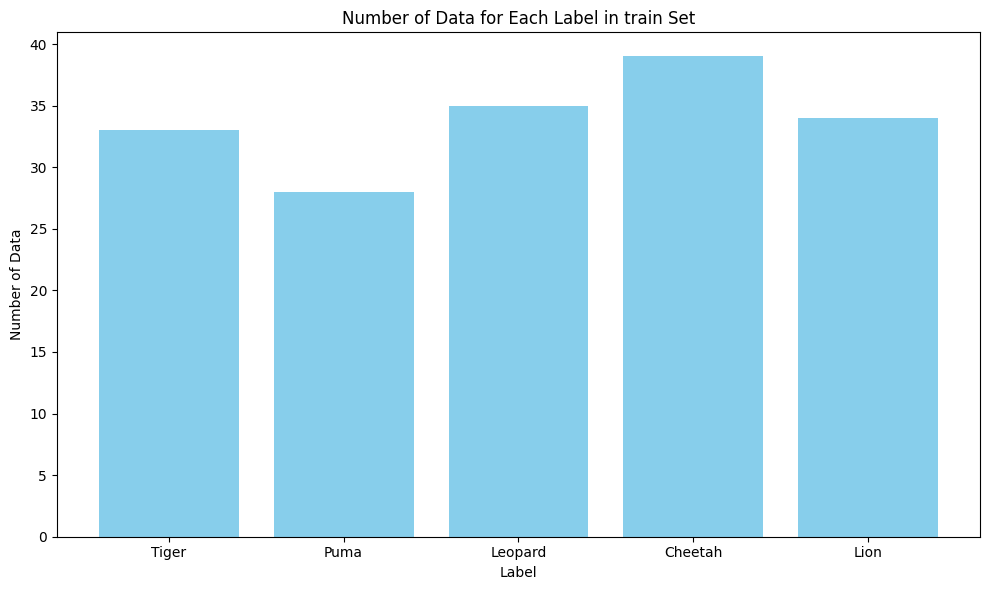

In [ ]:
# Menampilkan visualisasi jumlah data untuk setiap class pada Train Set
label_names, num_data = visual_path(train_dir)

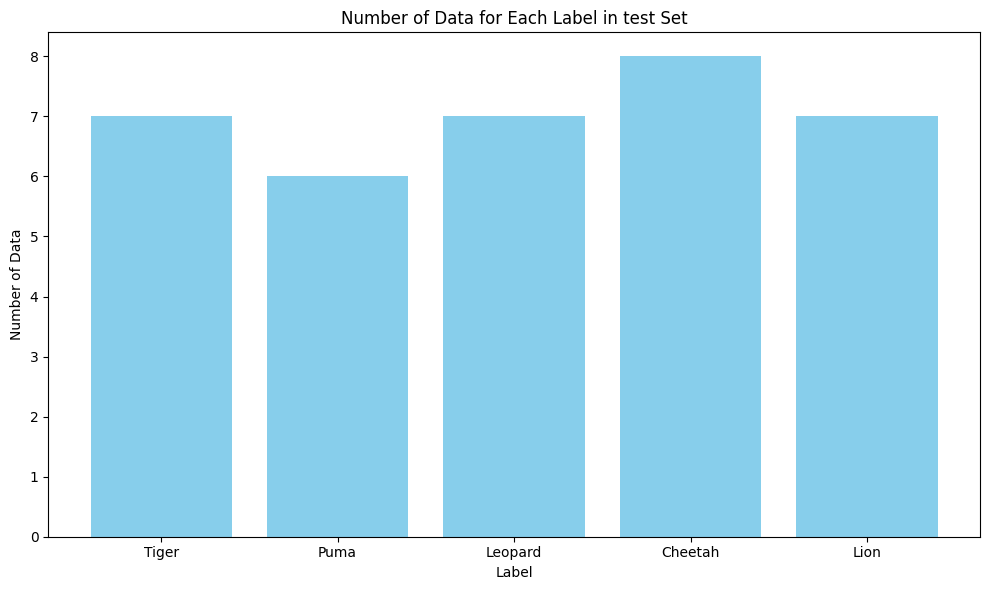

In [ ]:
# Menampilkan visualisasi jumlah data untuk setiap class pada Test Set
label_names, num_data = visual_path(test_dir)

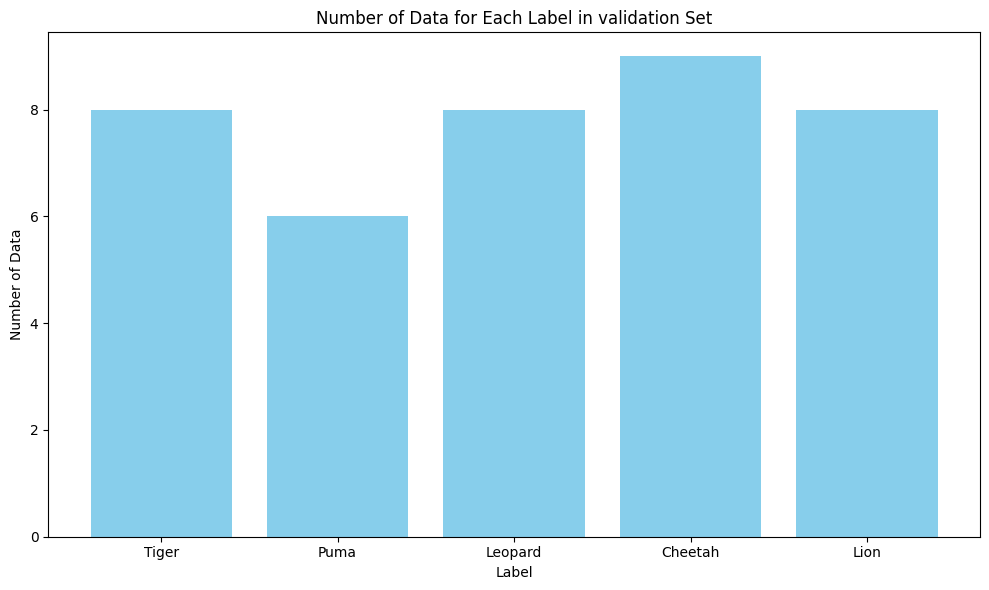

In [ ]:
# Menampilkan visualisasi jumlah data untuk setiap class pada Val Set
label_names, num_data = visual_path(val_dir)

#### Menampilkan gambar untuk setiap Class

In [ ]:
# Function untuk menampilkan visualisasi 5 gambar pertama dari setiap class
def plot_images(path):
  labels = os.listdir(path)
  for label in labels:
    folder_path = os.path.join(path, label)
    fig = plt.figure(figsize=(20, 20))
    columns = 5
    rows = 1
    print('Class : ', label)
    images = os.listdir(folder_path)
    for index in range(1, columns*rows +1):
        fig.add_subplot(rows, columns, index)
        image = plt.imread(os.path.join(folder_path, images[index]))
        plt.imshow(image)
        plt.axis("off")
    plt.show()

Class :  Tiger


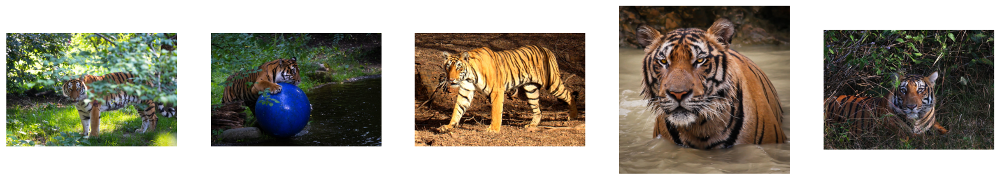

Class :  Puma


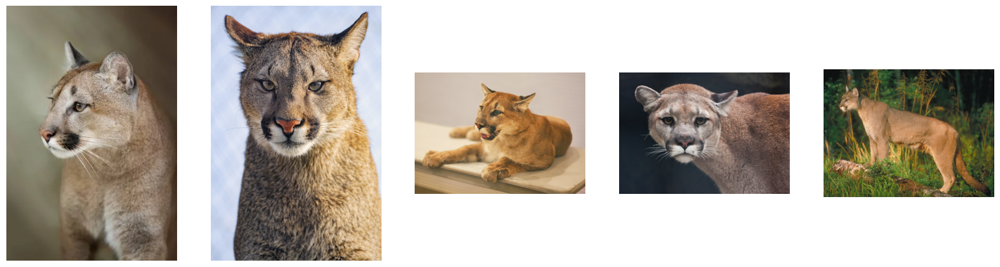

Class :  Leopard


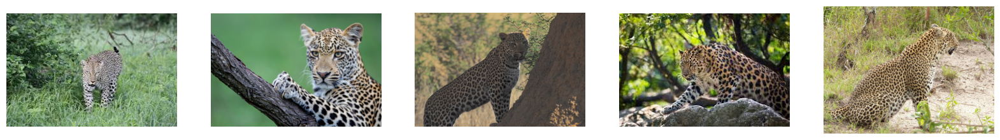

Class :  Cheetah


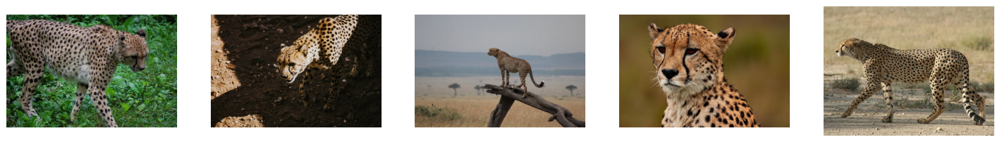

Class :  Lion


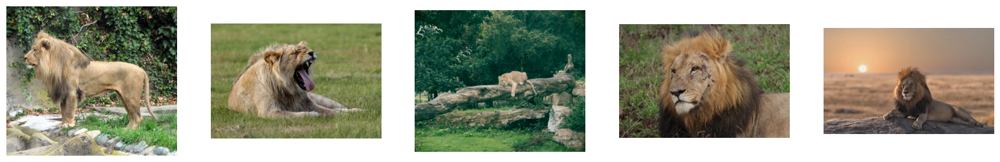

In [ ]:
# Menampilkan visualisasi 5 gambar pertama dari setiap class pada Train Set
plot_images(train_dir)

Class :  Tiger


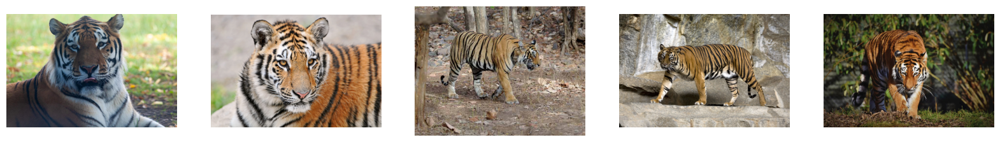

Class :  Puma


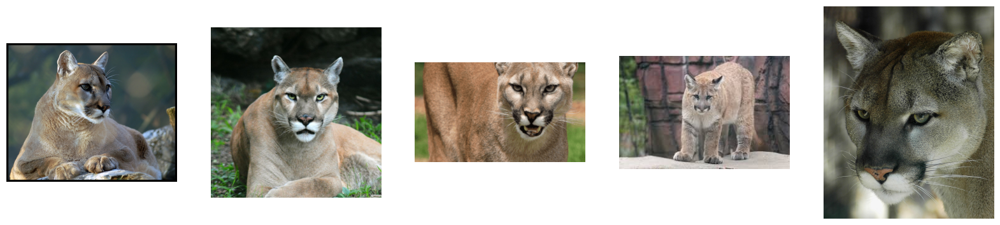

Class :  Leopard


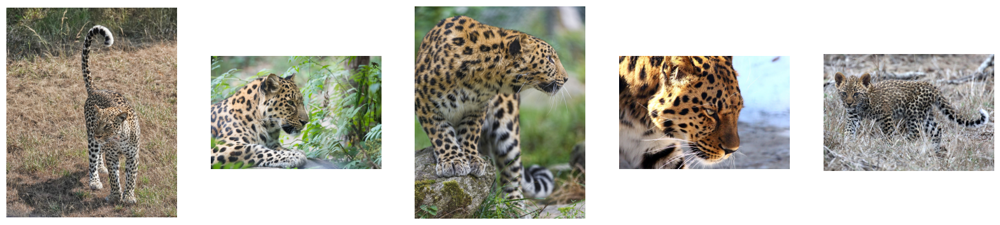

Class :  Cheetah


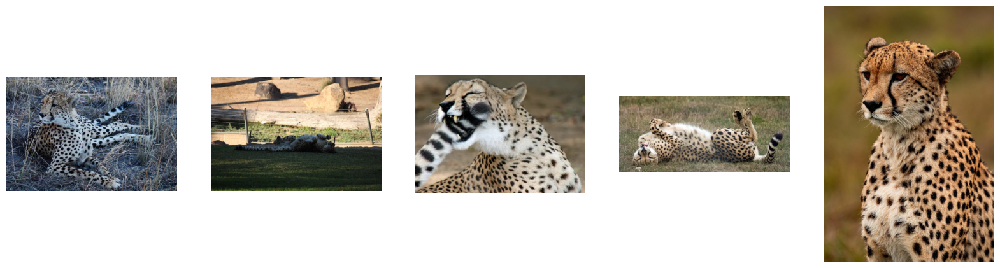

Class :  Lion


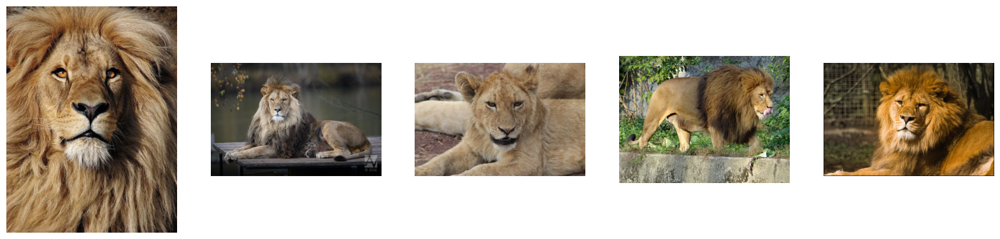

In [ ]:
# Menampilkan visualisasi 5 gambar pertama dari setiap class pada Test Set
plot_images(test_dir)

Class :  Tiger


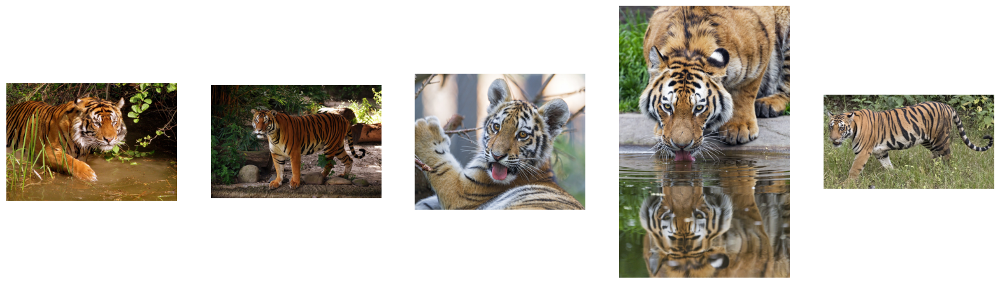

Class :  Puma


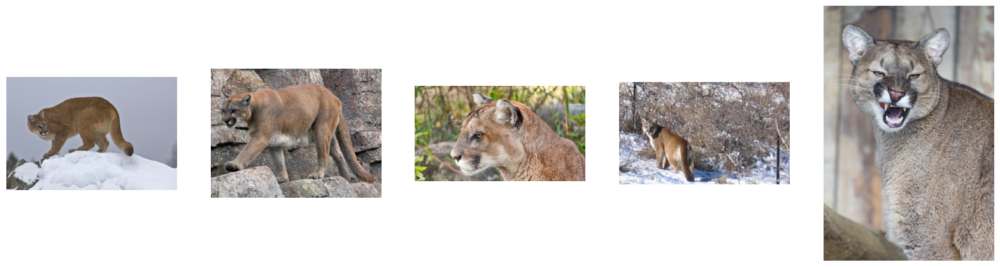

Class :  Leopard


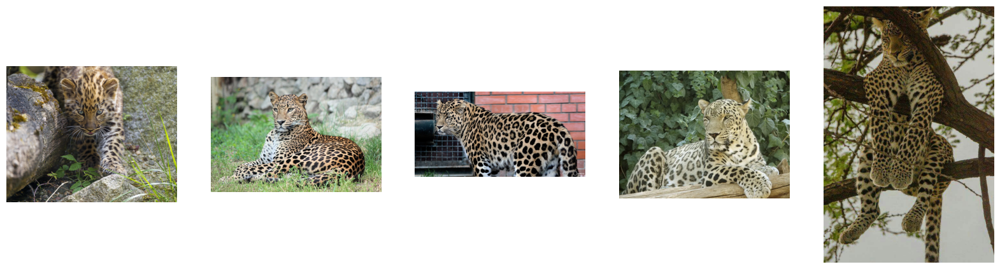

Class :  Cheetah


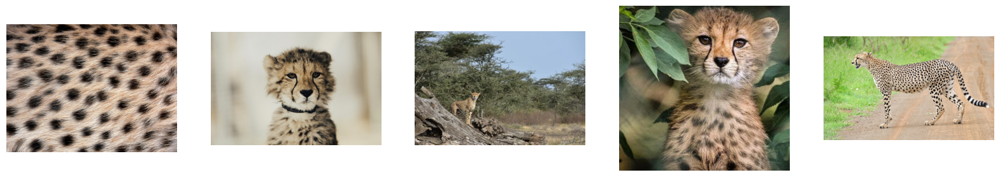

Class :  Lion


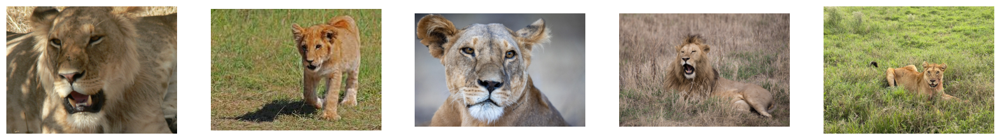

In [ ]:
# Menampilkan visualisasi 5 gambar pertama dari setiap class pada Val Set
plot_images(val_dir)

---
# 6 - ANN Training
Modeling without Data Augmentation

## 6.1 - Preprocessing

In [23]:
# Define hyperparameters
img_height= 220
img_width= 220
batch_size= 64

In [24]:
# Create batch generator for train-set, val-set, and test-set
train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255.,
                                                                validation_split=0.4)

train_set = train_datagen.flow_from_directory(train_dir,
                                              target_size=(img_height,img_width),
                                              class_mode='sparse',
                                              subset='training',
                                              batch_size=batch_size,
                                              shuffle=True,
                                              seed=2)

val_set = train_datagen.flow_from_directory(val_dir,
                                            target_size=(img_height,img_width),
                                            class_mode='sparse',
                                            subset='validation',
                                            batch_size=batch_size,
                                            shuffle=True,
                                            seed=2)

test_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255.)

test_set = test_datagen.flow_from_directory(test_dir,
                                            target_size=(img_height,img_width),
                                            class_mode='sparse',
                                            batch_size=batch_size,
                                            shuffle=False,
                                            seed=2)

Found 103 images belonging to 5 classes.
Found 14 images belonging to 5 classes.
Found 35 images belonging to 5 classes.


In [11]:
# Show labels
train_set.class_indices

{'Cheetah': 0, 'Leopard': 1, 'Lion': 2, 'Puma': 3, 'Tiger': 4}

## 6.2 - Model Definition

### 6.2.1 - Model Sequential

In [25]:
# Clear session
seed = 20
tf.keras.backend.clear_session()
np.random.seed(seed)
tf.random.set_seed(seed)

# Create Sequential API model
model_seq = Sequential()

# Convolution Architechture
model_seq.add(Conv2D(32, (3,3), activation='relu', input_shape=(img_height, img_width,3)))
model_seq.add(MaxPooling2D(2, 2))
model_seq.add(Conv2D(64, (3,3), activation='relu'))
model_seq.add(MaxPooling2D(2, 2))
model_seq.add(Conv2D(128, (3,3),activation='relu'))
model_seq.add(MaxPooling2D(2, 2))
model_seq.add(Conv2D(256, (3,3),activation='relu'))
model_seq.add(MaxPooling2D(2, 2))

# Architechture ANN biasa
model_seq.add(Flatten())
model_seq.add(Dropout(0.5))
model_seq.add(Dense(256, activation='relu'))
model_seq.add(Dense(5, activation='softmax'))

# Compile
model_seq.compile(loss='sparse_categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])
model_seq.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 218, 218, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 109, 109, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 107, 107, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 53, 53, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 51, 51, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 25, 25, 128)       0

Model Sequential base ini memiliki Convolutional dengan 4 Layer, layer pertama memiliki 32 filter, layer kedua 64 filter, layer ketiga 128 filter, dan layer keempat 256 filer. Dengan ukuran kernel 3x3 dan menggunakan fungsi aktivasi ReLU, diikuti oleh Max Pooling Layer dengan ukuran pooling 2x2.   

Kemudian, output dari Convolutional Layer 4 dilakukan flatten dan diberi Dropout dengan tingkat dropout sebesar 0.5 untuk mengurangi overfitting.  

Selanjutnya, data diproses melalui Dense Layer dengan 512 unit dan fungsi aktivasi ReLU, sebelum akhirnya dikelompokkan menjadi 5 kelas melalui Dense Layer terakhir dengan fungsi aktivasi softmax.  

Model kemudian dikompilasi dengan fungsi loss sparse_categorical_crossentropy, optimizer adam, dan metrik akurasi.

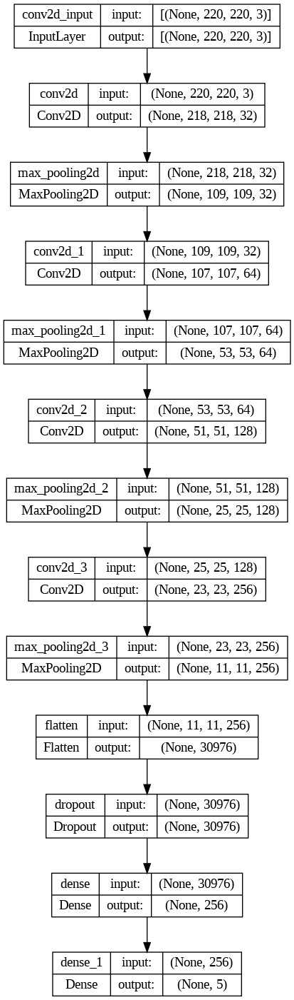

In [ ]:
# Plot layers
tf.keras.utils.plot_model(model_seq, show_shapes=True)

#### 6.2.1.1 - Model Training

In [26]:
%%time

# Train the model
history_seq = model_seq.fit(train_set,
                            epochs=25,
                            validation_data = val_set,
                            batch_size=batch_size)

Epoch 1/25
2/2 [==============================] - 5s 1s/step - loss: 2.7588 - accuracy: 0.1845 - val_loss: 1.6699 - val_accuracy: 0.2143
Epoch 2/25
2/2 [==============================] - 3s 2s/step - loss: 1.6890 - accuracy: 0.2039 - val_loss: 1.6090 - val_accuracy: 0.2857
Epoch 3/25
2/2 [==============================] - 3s 1s/step - loss: 1.6109 - accuracy: 0.2718 - val_loss: 1.6074 - val_accuracy: 0.2143
Epoch 4/25
2/2 [==============================] - 3s 2s/step - loss: 1.6062 - accuracy: 0.1942 - val_loss: 1.5996 - val_accuracy: 0.2143
Epoch 5/25
2/2 [==============================] - 3s 1s/step - loss: 1.6019 - accuracy: 0.1942 - val_loss: 1.5870 - val_accuracy: 0.2143
Epoch 6/25
2/2 [==============================] - 4s 2s/step - loss: 1.5938 - accuracy: 0.1845 - val_loss: 1.5779 - val_accuracy: 0.3571
Epoch 7/25
2/2 [==============================] - 3s 1s/step - loss: 1.5667 - accuracy: 0.4272 - val_loss: 1.5678 - val_accuracy: 0.2143
Epoch 8/25
2/2 [=========================

#### 6.2.1.2 - Model Evaluation

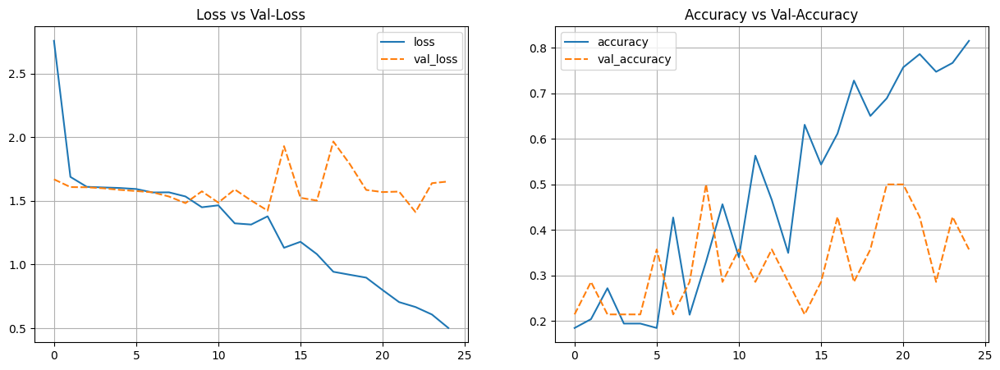

In [27]:
# Plot training results
history_seq_df = pd.DataFrame(history_seq.history)

plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
sns.lineplot(data=history_seq_df[['loss', 'val_loss']])
plt.grid()
plt.title('Loss vs Val-Loss')

plt.subplot(1, 2, 2)
sns.lineplot(data=history_seq_df[['accuracy', 'val_accuracy']])
plt.grid()
plt.title('Accuracy vs Val-Accuracy')
plt.show()

In [28]:
# Check the performance of test-set

# Get the probability
y_pred_prob_seq = model_seq.predict_generator(test_set)

# Get class with maximum probability
y_pred_class_seq = np.argmax(y_pred_prob_seq, axis=-1)

# Display Classification Report
print(classification_report(test_set.classes, y_pred_class_seq, target_names=np.array(list(train_set.class_indices.keys()))))

              precision    recall  f1-score   support

     Cheetah       0.35      0.75      0.48         8
     Leopard       0.50      0.29      0.36         7
        Lion       0.67      0.86      0.75         7
        Puma       1.00      0.17      0.29         6
       Tiger       0.25      0.14      0.18         7

    accuracy                           0.46        35
   macro avg       0.55      0.44      0.41        35
weighted avg       0.54      0.46      0.42        35



Model Sequential basic memiliki Accuracy score 0.46.  
Model memiliki kinerja yang baik dalam mengidentifikasi Class Lion, dan memiliki kinerja yang cukup baik dalam mengidentifikasi Class Cheetah dan Leopard , tetapi memiliki kesulitan dalam mengenali Class Puma dan Tiger.

### 6.2.2 - Model Functional

In [29]:
# Clear session
seed = 20
tf.keras.backend.clear_session()
np.random.seed(seed)
tf.random.set_seed(seed)

# Define the input layer
inputs = Input(shape=(img_height, img_width, 3))

# Branch 1
x = layers.Conv2D(32, kernel_size=(2, 2), activation='relu')(inputs)
x = layers.MaxPool2D(pool_size=(2, 2), padding='same')(x)

# Branch 2
y = layers.Conv2D(64, kernel_size=(2, 2), activation='relu')(inputs)
y = layers.MaxPool2D(pool_size=(2, 2), padding='same')(y)

# Concatenate branches
merged = layers.concatenate([x, y])

# Dense layer after concatenation
merged = layers.Dense(128, activation='relu')(merged)

# Branch 3
x = layers.Conv2D(128, kernel_size=(3, 3), activation='relu')(merged)
x = layers.MaxPool2D(pool_size=(2, 2), padding='same')(x)

# Branch 4
y = layers.Conv2D(256, kernel_size=(3, 3), activation='relu')(merged)
y = layers.MaxPool2D(pool_size=(2, 2), padding='same')(y)

# Concatenate branches using functional API
merged = layers.concatenate([x, y])

# Dense layer after concatenation
merged = layers.Dense(units=256, activation='relu')(merged)

# Flatten layer
merged = layers.Flatten()(merged)

# Dense layers for classification
merged = layers.Dense(256, activation='relu')(merged)
outputs = layers.Dense(5, activation='softmax')(merged)

# Create the model
model_func = Model(inputs, outputs)

# Compile
model_func.compile(loss='sparse_categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])

# Display model summary
model_func.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 220, 220, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 219, 219, 32)         416       ['input_1[0][0]']             
                                                                                                  
 conv2d_1 (Conv2D)           (None, 219, 219, 64)         832       ['input_1[0][0]']             
                                                                                                  
 max_pooling2d (MaxPooling2  (None, 110, 110, 32)         0         ['conv2d[0][0]']              
 D)                                                                                           

Model Functional base memiliki Convolutional dengan 4 Layer, layer pertama memiliki 32, layer kedua 64 filter, layer ketiga 128 filter, dan layer keempat 256 filter. Dengan ukuran kernel 3x3 dan menggunakan fungsi aktivasi ReLU, diikuti oleh lapisan max pooling dengan ukuran pooling 2x2 dan diikuti oleh Max Pooling layer.  

Setelah itu, output dari keempat Convolutional Layer dilakukan flatten dan diberi lapisan Dense dengan 512 unit dan menggunakan fungsi aktivasi ReLU.  

Selanjutnya, data diproses melalui Dropout layer dengan tingkat dropout sebesar 0.5 untuk mengurangi overfitting.  

Terakhir, output dari lapisan dropout disatukan dalam lapisan Dense terakhir dengan 10 unit dan menggunakan fungsi aktivasi softmax untuk menghasilkan output kelas.  

Model kemudian dikompilasi dengan fungsi loss sparse_categorical_crossentropy, optimizer adam, dan metrik akurasi.

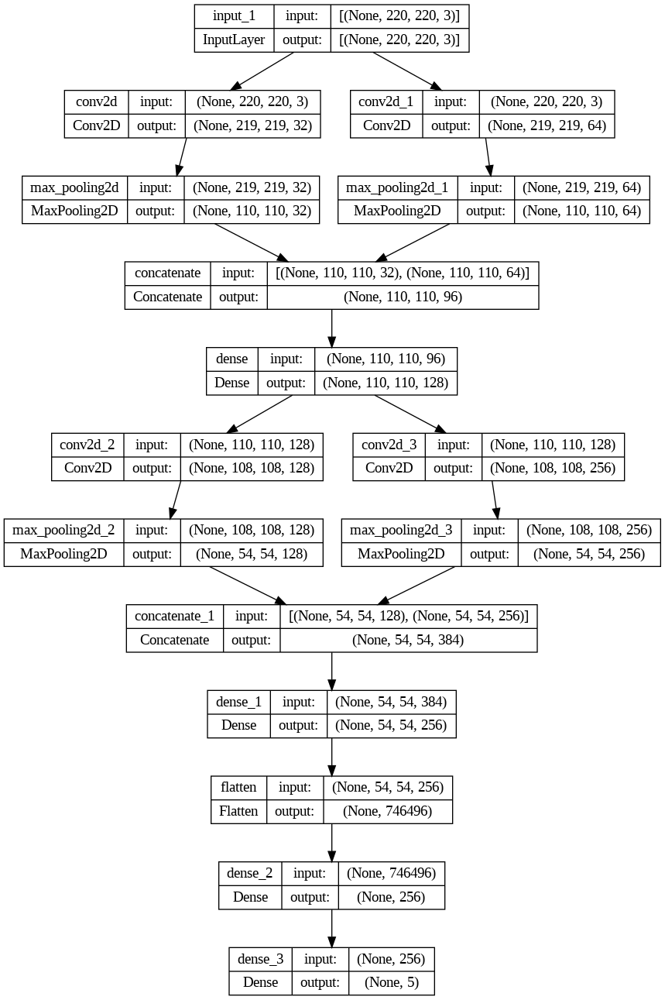

In [ ]:
# Plot layers
tf.keras.utils.plot_model(model_func, show_shapes=True)

#### 6.2.2.1 - Model Training

In [30]:
# Train the model
%%time
history_func = model_func.fit(train_set, epochs=25, validation_data=val_set, batch_size=batch_size)

Epoch 1/25
2/2 [==============================] - 24s 13s/step - loss: 34.2237 - accuracy: 0.1748 - val_loss: 34.2761 - val_accuracy: 0.2143
Epoch 2/25
2/2 [==============================] - 3s 1s/step - loss: 23.6270 - accuracy: 0.2621 - val_loss: 2.7333 - val_accuracy: 0.2143
Epoch 3/25
2/2 [==============================] - 4s 2s/step - loss: 2.5936 - accuracy: 0.1845 - val_loss: 2.9451 - val_accuracy: 0.1429
Epoch 4/25
2/2 [==============================] - 4s 2s/step - loss: 2.1659 - accuracy: 0.1650 - val_loss: 1.8879 - val_accuracy: 0.2143
Epoch 5/25
2/2 [==============================] - 3s 1s/step - loss: 1.7538 - accuracy: 0.2233 - val_loss: 1.6339 - val_accuracy: 0.2143
Epoch 6/25
2/2 [==============================] - 3s 959ms/step - loss: 1.5954 - accuracy: 0.2524 - val_loss: 1.5999 - val_accuracy: 0.2143
Epoch 7/25
2/2 [==============================] - 4s 1s/step - loss: 1.5079 - accuracy: 0.4272 - val_loss: 1.5904 - val_accuracy: 0.4286
Epoch 8/25
2/2 [=================

#### 6.2.2.2 - Model Evaluation

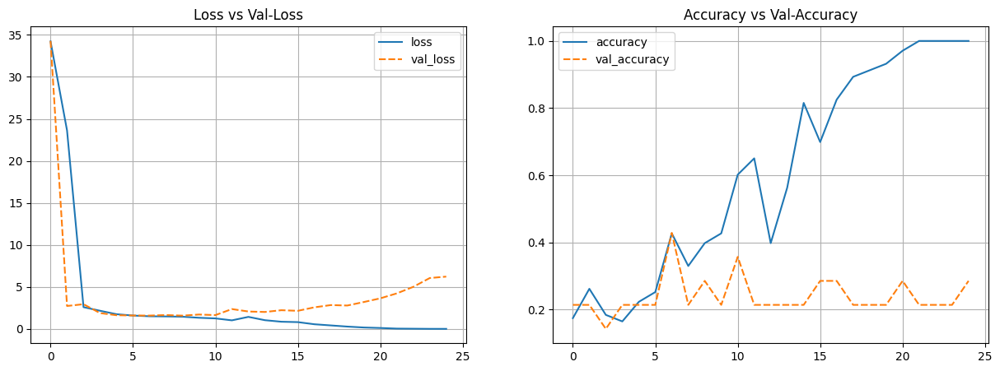

In [31]:
# Plot training results
history_func_df = pd.DataFrame(history_func.history)

plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
sns.lineplot(data=history_func_df[['loss', 'val_loss']])
plt.grid()
plt.title('Loss vs Val-Loss')

plt.subplot(1, 2, 2)
sns.lineplot(data=history_func_df[['accuracy', 'val_accuracy']])
plt.grid()
plt.title('Accuracy vs Val-Accuracy')
plt.show()

In [32]:
# Check the performance of test-set

# Get the probability
y_pred_prob_func = model_func.predict_generator(test_set)

# Get class with maximum probability
y_pred_class_func = np.argmax(y_pred_prob_func, axis=-1)

# Display Classification Report
print(classification_report(test_set.classes, y_pred_class_func, target_names=np.array(list(train_set.class_indices.keys()))))

              precision    recall  f1-score   support

     Cheetah       0.20      0.12      0.15         8
     Leopard       0.29      0.29      0.29         7
        Lion       0.29      0.29      0.29         7
        Puma       0.25      0.17      0.20         6
       Tiger       0.17      0.29      0.21         7

    accuracy                           0.23        35
   macro avg       0.24      0.23      0.23        35
weighted avg       0.24      0.23      0.23        35



Model Functional basic memiliki Accuracy score 0.23.  
Kinerja model cenderung buruk.
Model memiliki kinerja yang paling baik dalam mengidentifikasi Class Leopard dan Lion, dan memiliki kinerja paling buruk dalam mengidentifikasi Class Chetah.

---
# 7 - ANN Improvement
Modeling with Data Augmentation

## 7.1 - Preprocessing

In [13]:
# Create batch generator for train-set, val-set, and test-set

train_datagen_aug = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255.,
                                                                    rotation_range=20,
                                                                    zoom_range=0.05,
                                                                    width_shift_range=0.05,
                                                                    height_shift_range=0.05,
                                                                    shear_range=0.05,
                                                                    horizontal_flip=True,
                                                                    validation_split=0.4)

train_set_aug = train_datagen_aug.flow_from_directory(train_dir,
                                                      target_size=(img_height,img_width),
                                                      class_mode='sparse',
                                                      subset='training',
                                                      batch_size=batch_size,
                                                      shuffle=True,
                                                      seed=2)

val_set_aug = train_datagen_aug.flow_from_directory(val_dir,
                                                    target_size=(img_height,img_width),
                                                    class_mode='sparse',
                                                    subset='validation',
                                                    batch_size=batch_size,
                                                    shuffle=True,
                                                    seed=2)

test_datagen_aug = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255.)

test_set_aug = test_datagen_aug.flow_from_directory(test_dir,
                                                    target_size=(img_height,img_width),
                                                    class_mode='sparse',
                                                    batch_size=batch_size,
                                                    shuffle=False,
                                                    seed=2)

Found 103 images belonging to 5 classes.
Found 14 images belonging to 5 classes.
Found 35 images belonging to 5 classes.


## 7.2 - Model Definition

### 7.2.1 - Model Sequential

In [33]:
# Clear session
seed = 20
tf.keras.backend.clear_session()
np.random.seed(seed)
tf.random.set_seed(seed)

# Create Sequential API model
model_seq_aug = Sequential()

# Convolution Architechture
model_seq_aug.add(Conv2D(32, (3,3), activation='relu', kernel_initializer='RandomNormal', input_shape=(img_height, img_width,3)))
model_seq_aug.add(MaxPooling2D(2, 2))
model_seq_aug.add(Conv2D(64, (3,3), activation='relu', kernel_initializer='RandomNormal'))
model_seq_aug.add(MaxPooling2D(2, 2))
model_seq_aug.add(Conv2D(128, (3,3),activation='relu', kernel_initializer='RandomNormal'))
model_seq_aug.add(MaxPooling2D(2, 2))
model_seq_aug.add(Conv2D(256, (3,3),activation='relu', kernel_initializer='RandomNormal'))
model_seq_aug.add(MaxPooling2D(2, 2))

model_seq_aug.add(Flatten())
model_seq_aug.add(Dropout(0.5))
model_seq_aug.add(Dense(256, activation='relu'))
model_seq_aug.add(Dense(5, activation='softmax'))

# Compile
model_seq_aug.compile(loss='sparse_categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])
model_seq_aug.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 218, 218, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 109, 109, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 107, 107, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 53, 53, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 51, 51, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 25, 25, 128)       0

Model Sequential base ini memiliki Convolutional dengan 4 Layer, layer pertama memiliki 32 filter, layer kedua 64 filter, layer ketiga 128 filter, dan layer keempat 256 filer. Dengan ukuran kernel 3x3, menggunakan fungsi aktivasi ReLU dan menggunakan kernel initializer RandomNormal, kemudian diikuti oleh Max Pooling Layer dengan ukuran pooling 2x2.   

Kemudian, output dari Convolutional Layer 4 dilakukan flatten dan diberi Dropout dengan tingkat dropout sebesar 0.5 untuk mengurangi overfitting.  

Selanjutnya, data diproses melalui Dense Layer dengan 512 unit dan fungsi aktivasi ReLU, sebelum akhirnya dikelompokkan menjadi 5 kelas melalui Dense Layer terakhir dengan fungsi aktivasi softmax.  

Model kemudian dikompilasi dengan fungsi loss sparse_categorical_crossentropy, optimizer adam, dan metrik akurasi.

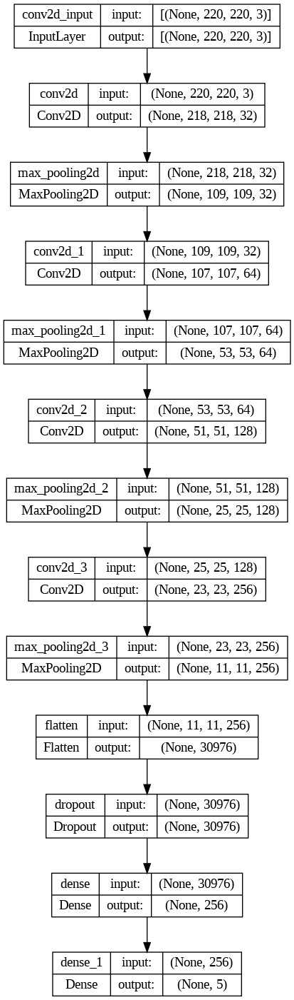

In [ ]:
# Plot layers

tf.keras.utils.plot_model(model_seq_aug, show_shapes=True)

#### 7.2.1.1 - Model Training

In [34]:
%%time
# Callback Definition
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model
history_seq_aug = model_seq_aug.fit(train_set_aug,
                            epochs=30,
                            validation_data = val_set_aug,
                            batch_size=batch_size,
                            callbacks=[early_stopping])

Epoch 1/30
2/2 [==============================] - 6s 3s/step - loss: 2.7197 - accuracy: 0.2039 - val_loss: 2.4157 - val_accuracy: 0.2143
Epoch 2/30
2/2 [==============================] - 5s 3s/step - loss: 2.0982 - accuracy: 0.1845 - val_loss: 1.6381 - val_accuracy: 0.1429
Epoch 3/30
2/2 [==============================] - 4s 2s/step - loss: 1.6145 - accuracy: 0.1845 - val_loss: 1.6066 - val_accuracy: 0.2143
Epoch 4/30
2/2 [==============================] - 4s 2s/step - loss: 1.6099 - accuracy: 0.2427 - val_loss: 1.5998 - val_accuracy: 0.2143
Epoch 5/30
2/2 [==============================] - 4s 2s/step - loss: 1.6111 - accuracy: 0.2233 - val_loss: 1.5985 - val_accuracy: 0.2143
Epoch 6/30
2/2 [==============================] - 4s 2s/step - loss: 1.5985 - accuracy: 0.2330 - val_loss: 1.5992 - val_accuracy: 0.2143
Epoch 7/30
2/2 [==============================] - 4s 2s/step - loss: 1.6024 - accuracy: 0.2233 - val_loss: 1.5937 - val_accuracy: 0.2143
Epoch 8/30
2/2 [=========================

Dalam melakukan training model sequential improvement ini ditambahkan EarlyStopping dengan memonitor val_loss. Epoch yang dijalankan sebanyak 23.

#### 7.2.1.2 - Model Evaluation

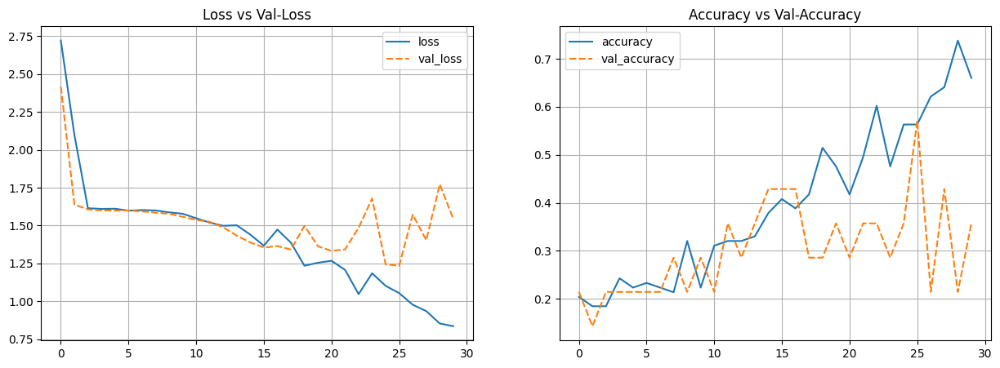

In [35]:
# Plot training results

history_seq_aug_df = pd.DataFrame(history_seq_aug.history)

plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
sns.lineplot(data=history_seq_aug_df[['loss', 'val_loss']])
plt.grid()
plt.title('Loss vs Val-Loss')

plt.subplot(1, 2, 2)
sns.lineplot(data=history_seq_aug_df[['accuracy', 'val_accuracy']])
plt.grid()
plt.title('Accuracy vs Val-Accuracy')
plt.show()

In [36]:
# Check the performance of test-set

## Get the probability
y_pred_prob_seq_aug = model_seq_aug.predict_generator(test_set_aug)

## Get class with maximum probability
y_pred_class_seq_aug = np.argmax(y_pred_prob_seq_aug, axis=-1)

## Display Classification Report
print(classification_report(test_set_aug.classes, y_pred_class_seq_aug, target_names=np.array(list(train_set_aug.class_indices.keys()))))

              precision    recall  f1-score   support

     Cheetah       0.38      0.38      0.38         8
     Leopard       0.27      0.43      0.33         7
        Lion       0.67      0.57      0.62         7
        Puma       0.67      0.33      0.44         6
       Tiger       0.29      0.29      0.29         7

    accuracy                           0.40        35
   macro avg       0.45      0.40      0.41        35
weighted avg       0.45      0.40      0.41        35



Model Sequential Improvement memiliki Accuracy score 0.40.  
Model memiliki kinerja yang cukup baik dalam mengidentifikasi Class Cheetah, Leopard, Lion, dan Tiger,  tetapi memiliki kesulitan dalam mengenali Class Puma.

### 7.2.2 - Model Functional

In [18]:
# Clear session
seed = 20
tf.keras.backend.clear_session()
np.random.seed(seed)
tf.random.set_seed(seed)

# Define the input layer
inputs = Input(shape=(img_height, img_width, 3))

# Branch 1
x = layers.Conv2D(32, kernel_size=(2, 2), activation='relu', kernel_initializer='RandomNormal')(inputs)
x = layers.MaxPool2D(pool_size=(2, 2), padding='same')(x)

# Branch 2
y = layers.Conv2D(64, kernel_size=(2, 2), activation='relu', kernel_initializer='RandomNormal')(inputs)
y = layers.MaxPool2D(pool_size=(2, 2), padding='same')(y)

# Concatenate branches
merged = layers.concatenate([x, y])

# Dense layer after concatenation
merged = layers.Dense(128, activation='relu', kernel_initializer='RandomNormal')(merged)

# Branch 3
x = layers.Conv2D(128, kernel_size=(3, 3), activation='relu', kernel_initializer='RandomNormal')(merged)
x = layers.MaxPool2D(pool_size=(2, 2), padding='same')(x)

# Branch 4
y = layers.Conv2D(128, kernel_size=(3, 3), activation='relu', kernel_initializer='RandomNormal')(merged)
y = layers.MaxPool2D(pool_size=(2, 2), padding='same')(y)

# Concatenate branches using functional API
merged = layers.concatenate([x, y])

# Dense layer after concatenation
merged = layers.Dense(units=256, activation='relu')(merged)

# Flatten layer
merged = layers.Flatten()(merged)

# Dense layers for classification
merged = layers.Dense(256, activation='relu')(merged)
outputs = layers.Dense(5, activation='softmax')(merged)

# Create the model
model_func_aug = Model(inputs, outputs)

# Compile
model_func_aug.compile(loss='sparse_categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])

# Display model summary
model_func_aug.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 220, 220, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 219, 219, 32)         416       ['input_1[0][0]']             
                                                                                                  
 conv2d_1 (Conv2D)           (None, 219, 219, 64)         832       ['input_1[0][0]']             
                                                                                                  
 max_pooling2d (MaxPooling2  (None, 110, 110, 32)         0         ['conv2d[0][0]']              
 D)                                                                                           

Model Functional base memiliki Convolutional dengan 4 Layer, layer pertama memiliki 32, layer kedua 64 filter, layer ketiga 128 filter, dan layer keempat 256 filter. Dengan ukuran kernel 3x3, menggunakan fungsi aktivasi ReLU, dan menggunakan kernel initializer RandomNormal, diikuti oleh lapisan max pooling dengan ukuran pooling 2x2 dan diikuti oleh Max Pooling layer.  

Setelah itu, output dari keempat Convolutional Layer dilakukan flatten dan diberi lapisan Dense dengan 512 unit dan menggunakan fungsi aktivasi ReLU.  

Selanjutnya, data diproses melalui Dropout layer dengan tingkat dropout sebesar 0.5 untuk mengurangi overfitting.  

Terakhir, output dari lapisan dropout disatukan dalam lapisan Dense terakhir dengan 10 unit dan menggunakan fungsi aktivasi softmax untuk menghasilkan output kelas.  

Model kemudian dikompilasi dengan fungsi loss sparse_categorical_crossentropy, optimizer adam, dan metrik akurasi.

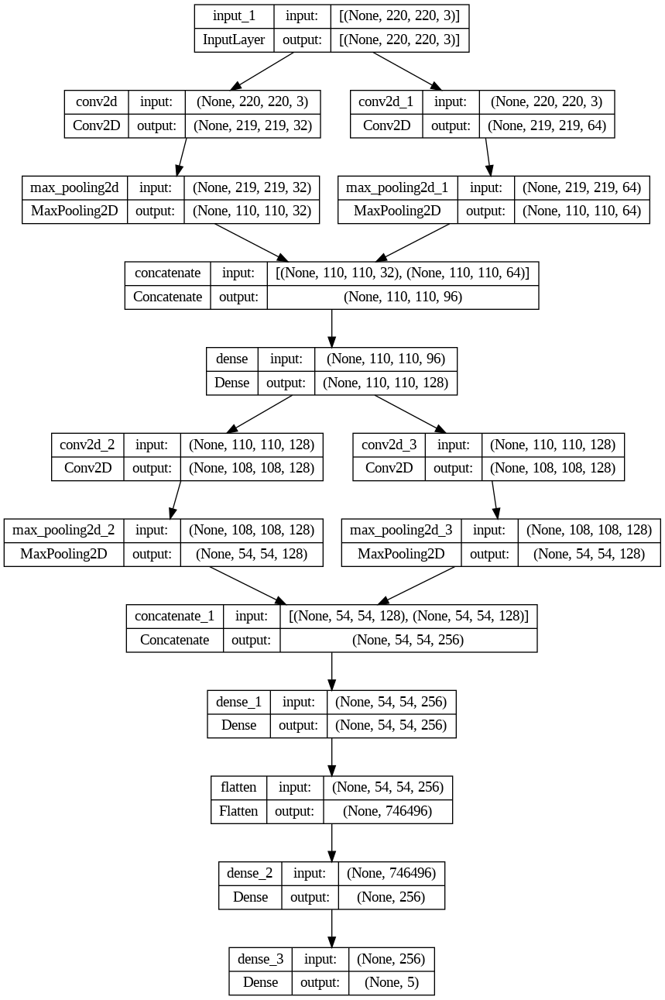

In [ ]:
# Plot layers

tf.keras.utils.plot_model(model_func_aug, show_shapes=True)

#### 7.2.2.1 - Model Training

In [19]:
%%time
# Callback Definition
early_stopping = EarlyStopping(monitor='accuracy', patience=5, restore_best_weights=True)

# Train the model
history_func_aug = model_func_aug.fit(train_set_aug,
                            epochs=30,
                            validation_data = val_set_aug,
                            batch_size=batch_size,
                            callbacks=[early_stopping])

Epoch 1/30
2/2 [==============================] - 23s 13s/step - loss: 16.4157 - accuracy: 0.1748 - val_loss: 9.2787 - val_accuracy: 0.2143
Epoch 2/30
2/2 [==============================] - 5s 3s/step - loss: 7.0430 - accuracy: 0.2039 - val_loss: 3.5542 - val_accuracy: 0.1429
Epoch 3/30
2/2 [==============================] - 9s 7s/step - loss: 2.3855 - accuracy: 0.1553 - val_loss: 1.6067 - val_accuracy: 0.2143
Epoch 4/30
2/2 [==============================] - 5s 2s/step - loss: 1.5569 - accuracy: 0.2524 - val_loss: 1.6114 - val_accuracy: 0.1429
Epoch 5/30
2/2 [==============================] - 6s 4s/step - loss: 1.6048 - accuracy: 0.3010 - val_loss: 1.8016 - val_accuracy: 0.2143
Epoch 6/30
2/2 [==============================] - 4s 2s/step - loss: 1.6927 - accuracy: 0.2039 - val_loss: 1.5716 - val_accuracy: 0.2143
Epoch 7/30
2/2 [==============================] - 5s 3s/step - loss: 1.5201 - accuracy: 0.3301 - val_loss: 1.5896 - val_accuracy: 0.2143
Epoch 8/30
2/2 [======================

Dalam melakukan training model functional improvement ini ditambahkan EarlyStopping dengan memonitor accuracy. Epoch yang dijalankan sebanyak 30. Monitor yang dipilih adalah accuracy karena setelah trial and error jika menggunakan val_loss Epoch yang dijalankan sangat sedikit dan model sangat buruk.

#### 7.2.2.2 - Model Evaluation

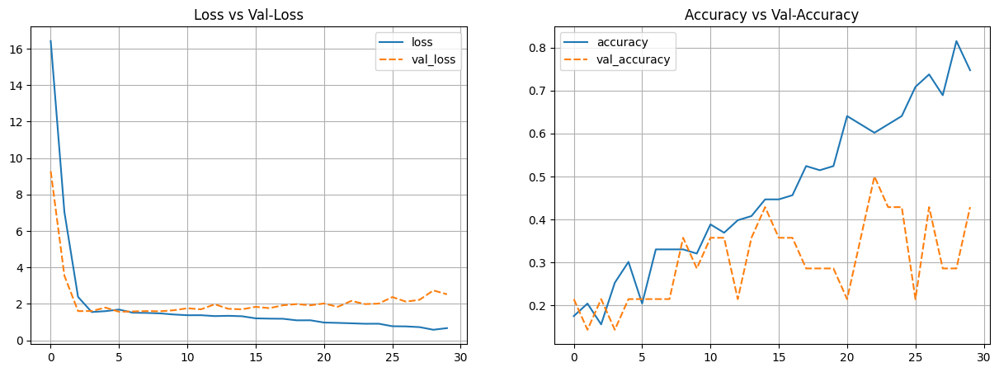

In [20]:
# Plot training results

history_func_aug_df = pd.DataFrame(history_func_aug.history)

plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
sns.lineplot(data=history_func_aug_df[['loss', 'val_loss']])
plt.grid()
plt.title('Loss vs Val-Loss')

plt.subplot(1, 2, 2)
sns.lineplot(data=history_func_aug_df[['accuracy', 'val_accuracy']])
plt.grid()
plt.title('Accuracy vs Val-Accuracy')
plt.show()

In [22]:
# Check the performance of test-set

## Get the probability
y_pred_prob_func_aug = model_func_aug.predict_generator(test_set_aug)

## Get class with maximum probability
y_pred_class_func_aug = np.argmax(y_pred_prob_func_aug, axis=-1)

## Display Classification Report
print(classification_report(test_set_aug.classes, y_pred_class_func_aug, target_names=np.array(list(train_set_aug.class_indices.keys()))))

              precision    recall  f1-score   support

     Cheetah       0.14      0.12      0.13         8
     Leopard       0.30      0.43      0.35         7
        Lion       0.50      0.14      0.22         7
        Puma       0.33      0.17      0.22         6
       Tiger       0.23      0.43      0.30         7

    accuracy                           0.26        35
   macro avg       0.30      0.26      0.25        35
weighted avg       0.30      0.26      0.24        35



Model Functional Improvement memiliki Accuracy score 0.26.
Kinerja model cenderung buruk.
Model memiliki kinerja yang paling baik dalam mengidentifikasi Class Leopard, dan memiliki kinerja paling buruk dalam mengidentifikasi Class Cheetah.

---
# 8 - Model Saving

In [39]:
# Save model ke drive
model_seq.save('/content/drive/My Drive/model.h5')

---
# 9 - Model Inference

---
# 10 - Conclusion

Metric yang digunakan adalah Accuracy karena diharapkan dapat memberikan gambaran keseluruhan tentang seberapa baik model berkinerja dalam mengklasifikasikan seluruh kelas-kelas pada dataset. Ini memberikan informasi yang berguna tentang seberapa baik model.  

Model terbaik yang dipilih adalah Model Sequential Basic (sebelum dilakukan improvement) dengan Accuracy score 0.46.  


- Kelemahan dari model yang dibuat :  
Nilai accuracy dari model masih tergolong cukup rendah.  
Model sensitif terhadap perubahan skala dan rotasi,model tidak mampu mengenali objek yang sama dalam skala atau orientasi yang berbeda.

- Kelebihan dari model yang dibuat :  
Mmampu melakukan ekstraksi fitur secara otomatis dari gambar tanpa memerlukan fitur yang diextract secara manual. Ini memungkinkan model untuk mempelajari representasi yang lebih baik dari data gambar.  
Dan penggunaan dropout layer dapat membantu mengurangi overfitting dengan mematikan secara acak sebagian unit pada setiap iterasi training, sehingga mencegah ketergantungan yang terlalu kuat pada unit-unit tertentu.

- Statement improvement dari model yang dibuat :  
Bisa dilakukan penambahan data dengan emperbanyak data untuk kelas-kelas yang memiliki support rendah dapat membantu model untuk mempelajari pola-pola yang lebih baik.  
Untuk mengatasi data imbalance dapat menggunakan metric lain yang lebih tahan terhadap data imbalance agar model dapat bekerja lebih baik.
